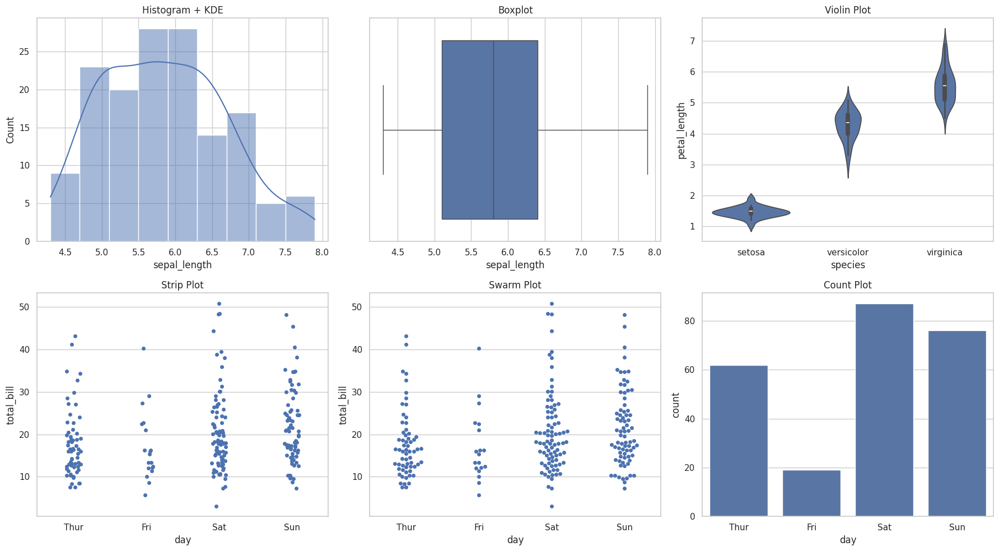

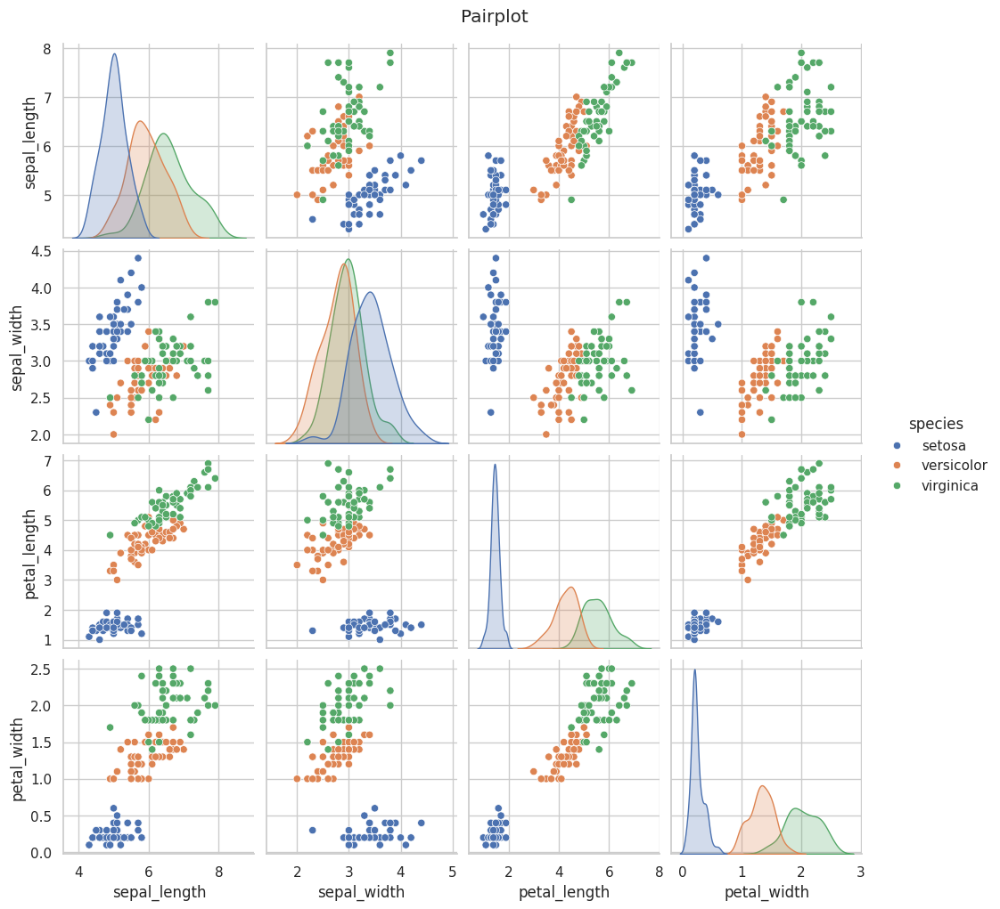

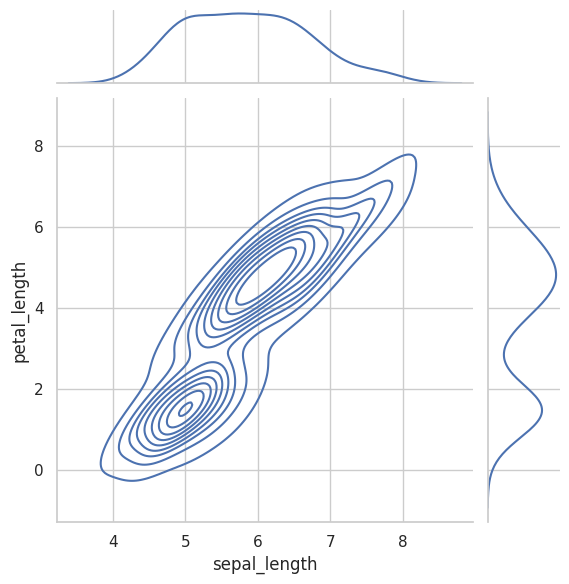

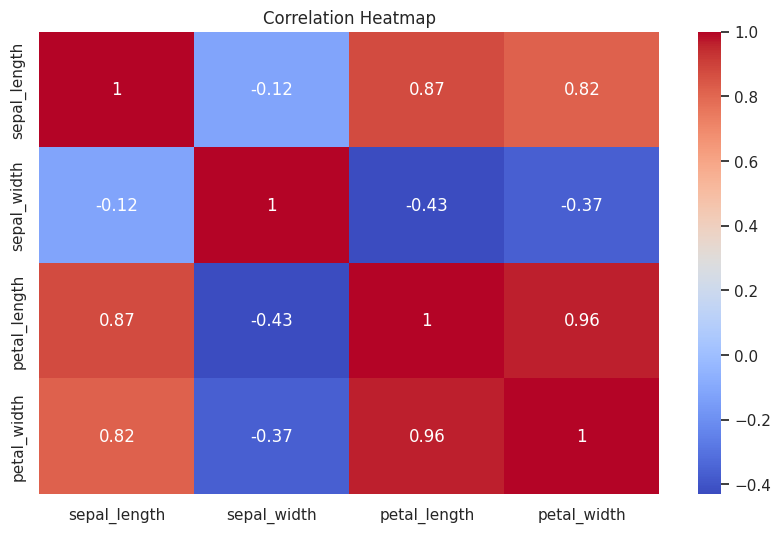

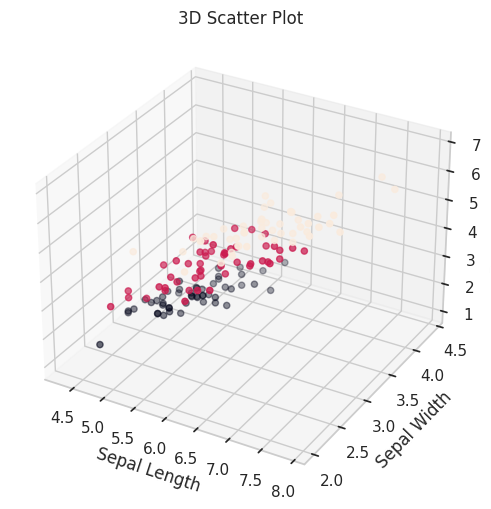

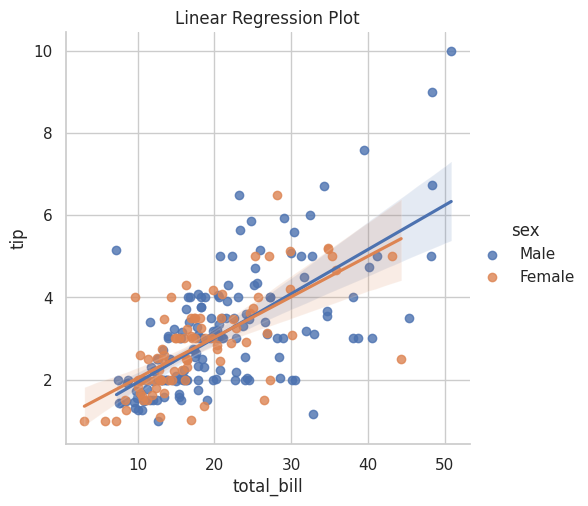

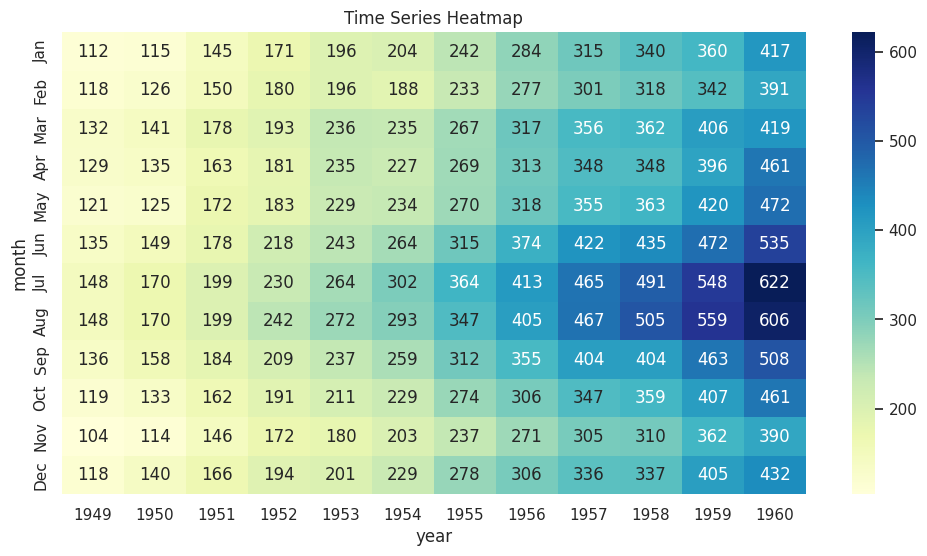

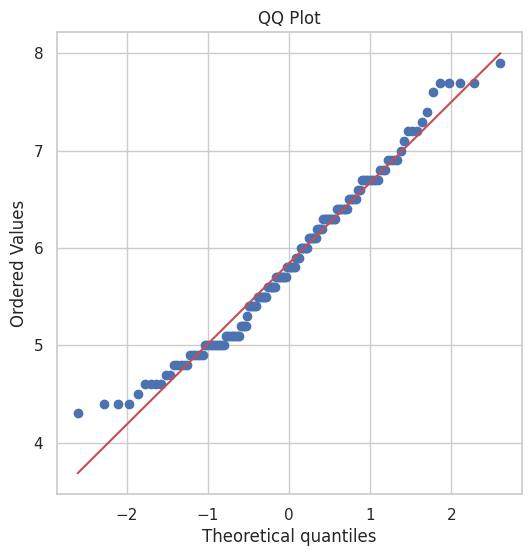

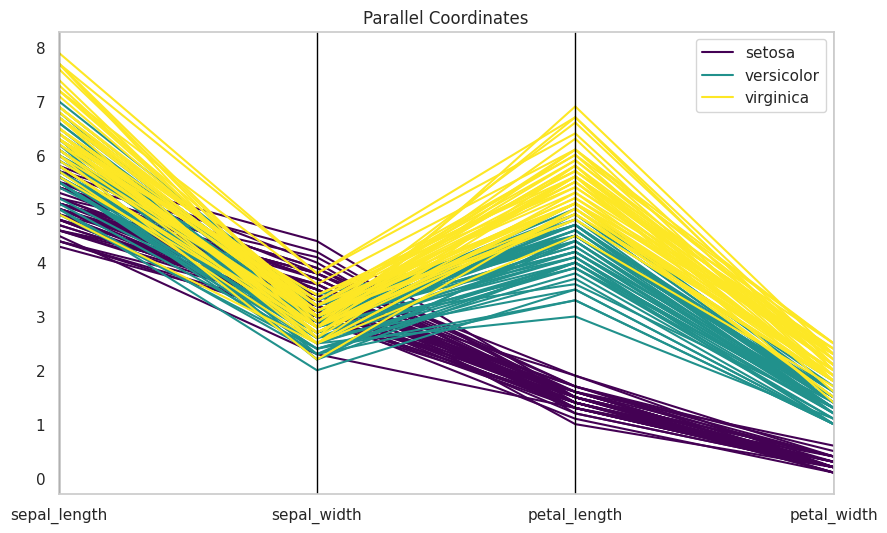

In [21]:
# @title
# All the Stats Visualizations: The Ultimate Plot Parade
# Designed for Google Colab – unleash statistical insanity

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import altair as alt
import scipy.stats as stats
from pandas.plotting import scatter_matrix, parallel_coordinates
from mpl_toolkits.mplot3d import Axes3D
import warnings
warnings.filterwarnings("ignore")

# Load sample datasets
iris = sns.load_dataset("iris")
tips = sns.load_dataset("tips")
titanic = sns.load_dataset("titanic")
flights = sns.load_dataset("flights")

# Set style
sns.set(style="whitegrid")

# UNIVARIATE PLOTS
fig, axs = plt.subplots(2, 3, figsize=(18, 10))
sns.histplot(iris['sepal_length'], kde=True, ax=axs[0,0])
axs[0,0].set_title("Histogram + KDE")
sns.boxplot(x=iris['sepal_length'], ax=axs[0,1])
axs[0,1].set_title("Boxplot")
sns.violinplot(x=iris['species'], y=iris['petal_length'], ax=axs[0,2])
axs[0,2].set_title("Violin Plot")
sns.stripplot(x=tips['day'], y=tips['total_bill'], ax=axs[1,0])
axs[1,0].set_title("Strip Plot")
sns.swarmplot(x=tips['day'], y=tips['total_bill'], ax=axs[1,1])
axs[1,1].set_title("Swarm Plot")
sns.countplot(x=tips['day'], ax=axs[1,2])
axs[1,2].set_title("Count Plot")
plt.tight_layout()
plt.show()

# BIVARIATE PLOTS
sns.pairplot(iris, hue="species")
plt.suptitle("Pairplot", y=1.02)
plt.show()

sns.jointplot(data=iris, x="sepal_length", y="petal_length", kind="kde")
plt.show()

# Correlation Heatmap (FIXED)
plt.figure(figsize=(10, 6))
sns.heatmap(iris.select_dtypes(include='number').corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

# 3D Scatter Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(iris['sepal_length'], iris['sepal_width'], iris['petal_length'], c=iris['species'].astype('category').cat.codes)
ax.set_xlabel('Sepal Length')
ax.set_ylabel('Sepal Width')
ax.set_zlabel('Petal Length')
plt.title("3D Scatter Plot")
plt.show()

# Regression Plots
sns.lmplot(x="total_bill", y="tip", hue="sex", data=tips)
plt.title("Linear Regression Plot")
plt.show()

# Time Series – Heatmap (FIXED)
flights_pivot = flights.pivot(index="month", columns="year", values="passengers")
plt.figure(figsize=(12, 6))
sns.heatmap(flights_pivot, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Time Series Heatmap")
plt.show()

# QQ Plot
plt.figure(figsize=(6,6))
stats.probplot(iris['sepal_length'], dist="norm", plot=plt)
plt.title("QQ Plot")
plt.show()

# Parallel Coordinates
plt.figure(figsize=(10, 6))
parallel_coordinates(iris, class_column='species', colormap='viridis')
plt.title("Parallel Coordinates")
plt.show()

# Altair Visualization
alt.data_transformers.disable_max_rows()
alt.Chart(tips).mark_bar().encode(
    x='day',
    y='mean(tip)',
    color='sex'
).properties(title='Altair: Mean Tip per Day by Sex')

# Plotly Express
fig = px.scatter(tips, x="total_bill", y="tip", color="sex", size="size", hover_data=['day'])
fig.update_layout(title="Plotly: Total Bill vs Tip")
fig.show()


In [22]:
!pip install joypy

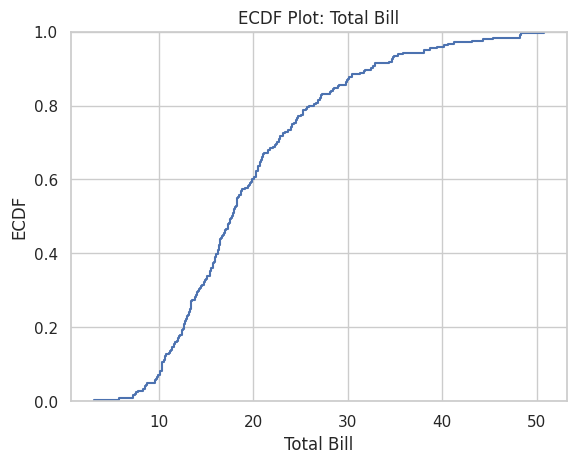

<Figure size 1000x600 with 0 Axes>

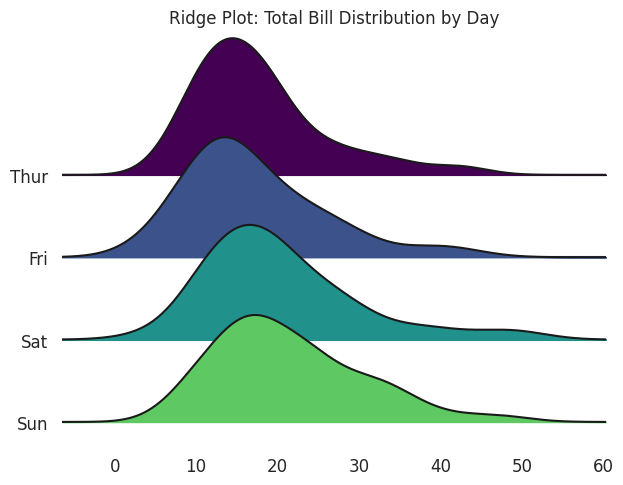

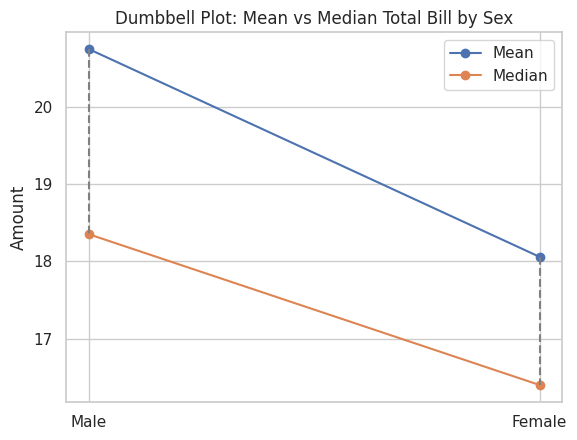

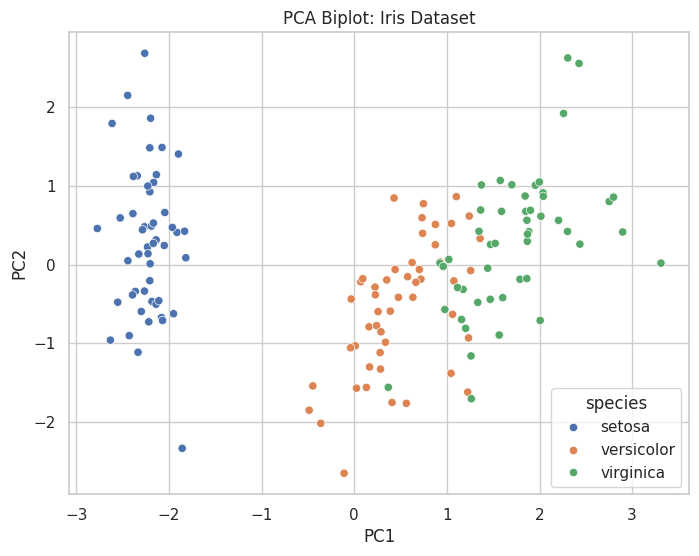

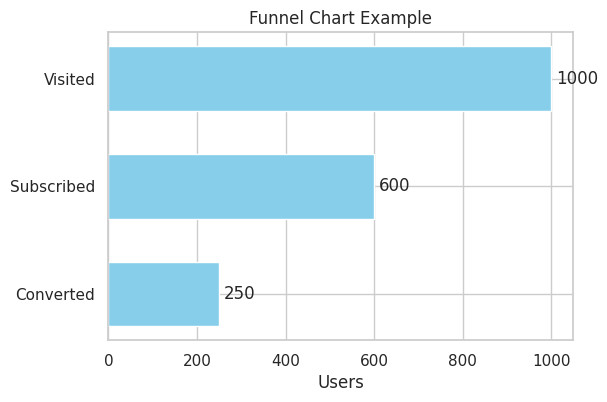

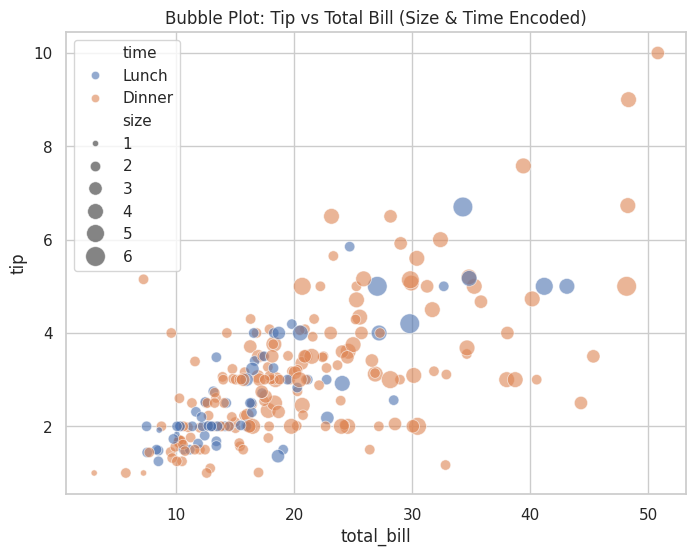

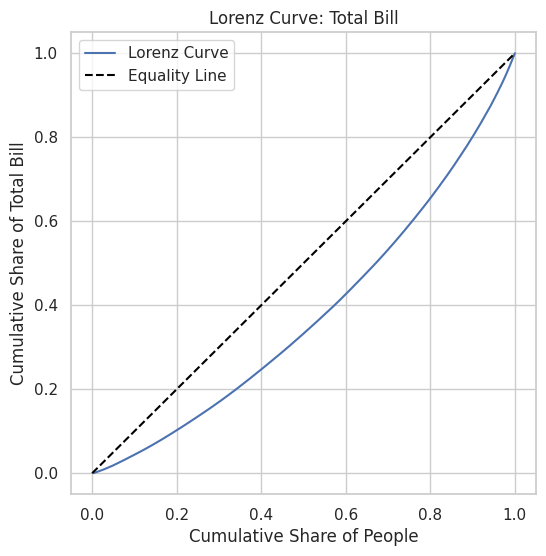

In [23]:
# Required Libraries (add if not imported already)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import joypy
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from matplotlib.ticker import FuncFormatter

# Dataset (using Tips for variety)
tips = sns.load_dataset("tips")

# 1. ECDF Plot (Empirical Cumulative Distribution Function)
sns.ecdfplot(tips["total_bill"])
plt.title("ECDF Plot: Total Bill")
plt.xlabel("Total Bill")
plt.ylabel("ECDF")
plt.show()

# 2. Ridge Plot / Joyplot (Distribution by category)
plt.figure(figsize=(10, 6))
joypy.joyplot(tips, by="day", column="total_bill", colormap=plt.cm.viridis)
plt.title("Ridge Plot: Total Bill Distribution by Day")
plt.show()

# 3. Dumbbell Plot (Difference between two groups)
grouped = tips.groupby("sex")["total_bill"].agg(["mean", "median"]).T
plt.plot(grouped.columns, grouped.loc["mean"], marker="o", label="Mean")
plt.plot(grouped.columns, grouped.loc["median"], marker="o", label="Median")
for x in grouped.columns:
    plt.plot([x, x], grouped.loc[:, x], color="gray", linestyle="--")
plt.title("Dumbbell Plot: Mean vs Median Total Bill by Sex")
plt.ylabel("Amount")
plt.legend()
plt.show()

# 4. PCA Biplot (Dimensionality reduction with interpretation)
iris = sns.load_dataset("iris")
X = iris.select_dtypes(include="number")
X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(pca_components, columns=["PC1", "PC2"])
pca_df["species"] = iris["species"]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x="PC1", y="PC2", hue="species")
plt.title("PCA Biplot: Iris Dataset")
plt.show()

# 5. Funnel Chart (using matplotlib bar)
stages = ['Visited', 'Subscribed', 'Converted']
values = [1000, 600, 250]
plt.figure(figsize=(6,4))
for i, (stage, value) in enumerate(zip(stages, values)):
    plt.barh(i, value, height=0.6, color='skyblue')
    plt.text(value + 10, i, str(value), va='center')
plt.yticks(range(len(stages)), stages)
plt.gca().invert_yaxis()
plt.title("Funnel Chart Example")
plt.xlabel("Users")
plt.show()

# 6. Bubble Plot
plt.figure(figsize=(8,6))
sns.scatterplot(data=tips, x="total_bill", y="tip", size="size", hue="time", alpha=0.6, sizes=(20, 200))
plt.title("Bubble Plot: Tip vs Total Bill (Size & Time Encoded)")
plt.show()

# 7. Lorenz Curve (Income Distribution Inequality)
income = np.sort(tips["total_bill"].values)
cum_income = np.cumsum(income) / income.sum()
cum_population = np.arange(1, len(income)+1) / len(income)
plt.figure(figsize=(6,6))
plt.plot(cum_population, cum_income, label="Lorenz Curve")
plt.plot([0,1], [0,1], linestyle='--', color='black', label="Equality Line")
plt.title("Lorenz Curve: Total Bill")
plt.xlabel("Cumulative Share of People")
plt.ylabel("Cumulative Share of Total Bill")
plt.legend()
plt.show()


In [24]:
!pip install pywaffle

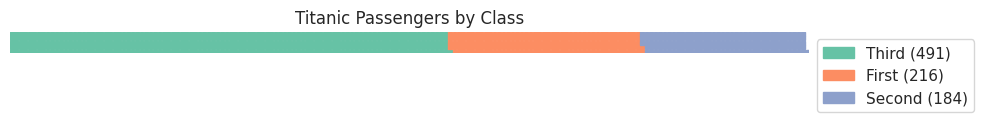

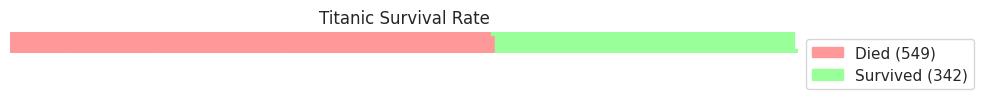

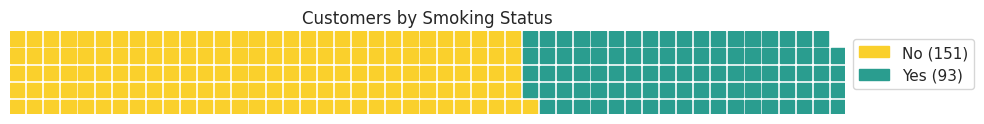

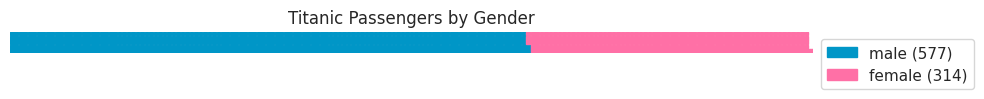

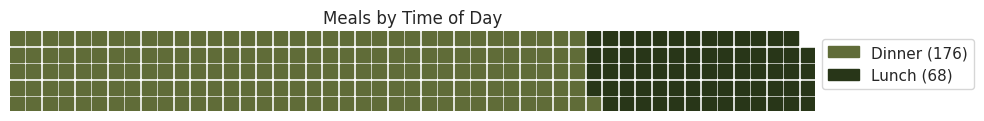

In [25]:
from pywaffle import Waffle
import matplotlib.pyplot as plt
import seaborn as sns

# Sample datasets
titanic = sns.load_dataset("titanic")
tips = sns.load_dataset("tips")

# 1. Waffle Chart – Titanic Class Breakdown
data = titanic['class'].value_counts().to_dict()
fig = plt.figure(
    FigureClass=Waffle,
    rows=5,
    values=data,
    title={'label': 'Titanic Passengers by Class', 'loc': 'center'},
    labels=[f"{k} ({v})" for k, v in data.items()],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1)},
    figsize=(10, 5)
)
plt.show()

# 2. Waffle Chart – Survival Breakdown
data = titanic['survived'].value_counts().sort_index()
survival_labels = {0: 'Died', 1: 'Survived'}
data.index = data.index.map(survival_labels)
fig = plt.figure(
    FigureClass=Waffle,
    rows=5,
    values=data.to_dict(),
    title={'label': 'Titanic Survival Rate', 'loc': 'center'},
    labels=[f"{k} ({v})" for k, v in data.to_dict().items()],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1)},
    figsize=(10, 5),
    colors=["#FF9999", "#99FF99"]
)
plt.show()

# 3. Waffle Chart – Tips by Smoking Status
data = tips["smoker"].value_counts().to_dict()
fig = plt.figure(
    FigureClass=Waffle,
    rows=5,
    values=data,
    title={'label': 'Customers by Smoking Status', 'loc': 'center'},
    labels=[f"{k} ({v})" for k, v in data.items()],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1)},
    colors=["#FAD02C", "#2A9D8F"],
    figsize=(10, 5)
)
plt.show()

# 4. Waffle Chart – Passengers by Gender
data = titanic["sex"].value_counts().to_dict()
fig = plt.figure(
    FigureClass=Waffle,
    rows=5,
    values=data,
    title={'label': 'Titanic Passengers by Gender', 'loc': 'center'},
    labels=[f"{k} ({v})" for k, v in data.items()],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1)},
    colors=["#0096C7", "#FF70A6"],
    figsize=(10, 5)
)
plt.show()

# 5. Waffle Chart – Tips by Time of Day
data = tips["time"].value_counts().to_dict()
fig = plt.figure(
    FigureClass=Waffle,
    rows=5,
    values=data,
    title={'label': 'Meals by Time of Day', 'loc': 'center'},
    labels=[f"{k} ({v})" for k, v in data.items()],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1)},
    colors=["#606C38", "#283618"],
    figsize=(10, 5)
)
plt.show()


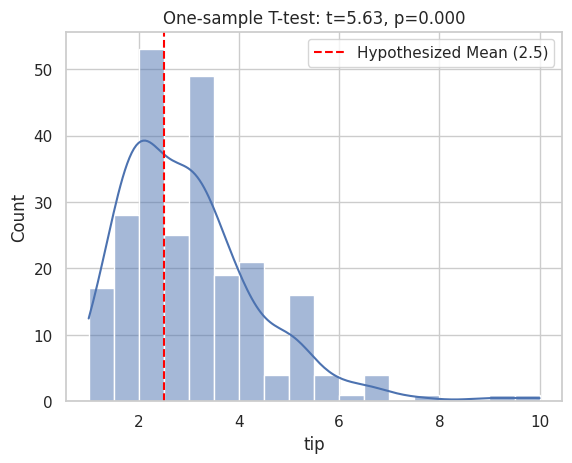

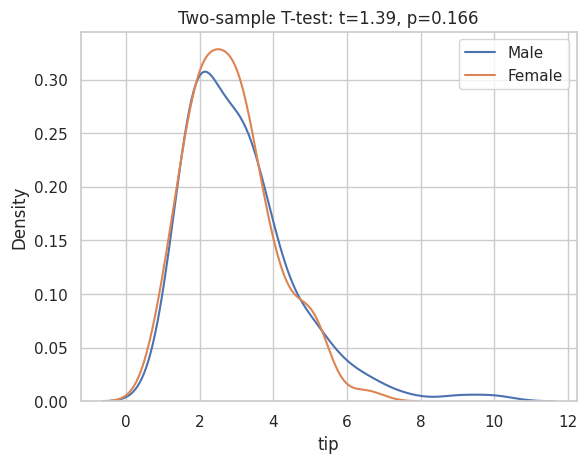

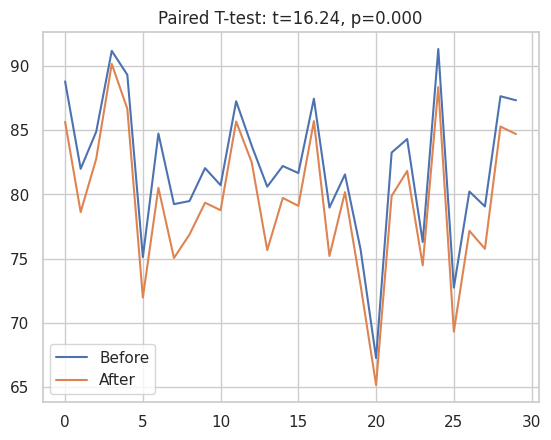

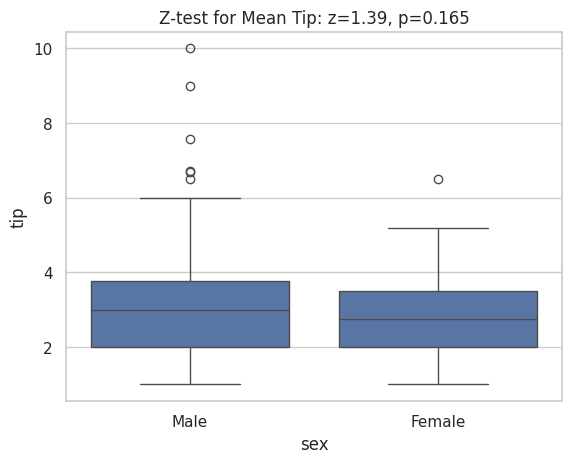

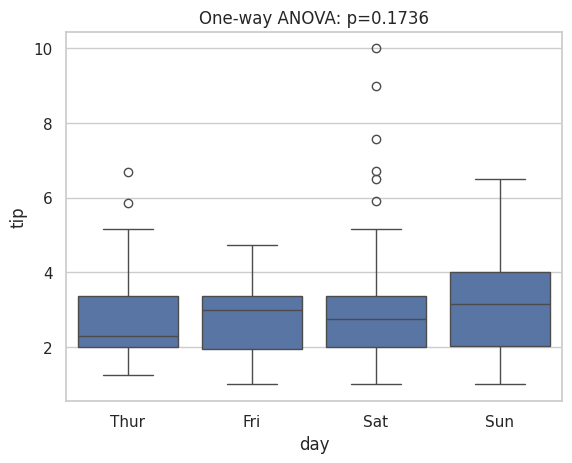

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   Fri    Sat   0.2584 0.8806 -0.6444 1.1611  False
   Fri    Sun   0.5204 0.4558  -0.394 1.4348  False
   Fri   Thur   0.0367 0.9996 -0.8981 0.9715  False
   Sat    Sun    0.262 0.6204 -0.2977 0.8217  False
   Sat   Thur  -0.2217 0.7679 -0.8141 0.3708  False
   Sun   Thur  -0.4837 0.1724 -1.0938 0.1264  False
---------------------------------------------------


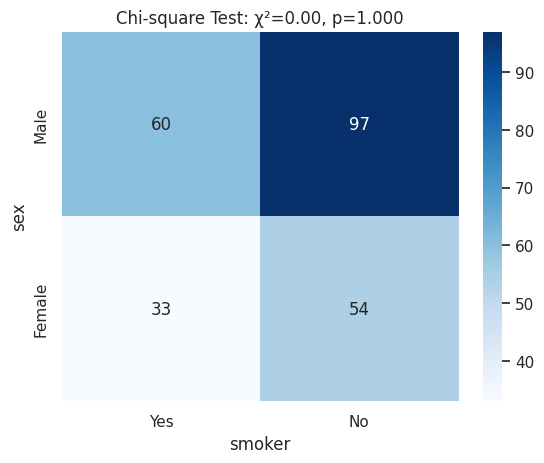

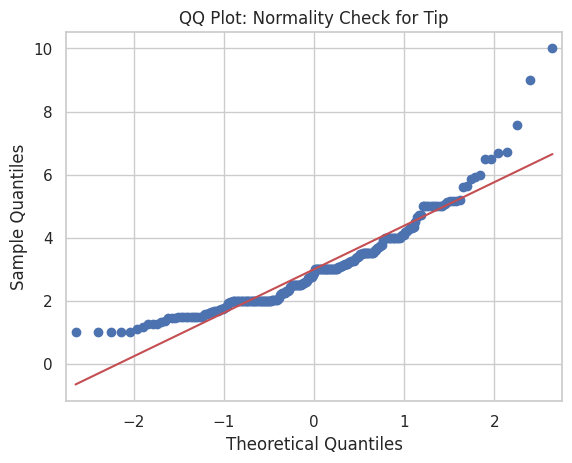

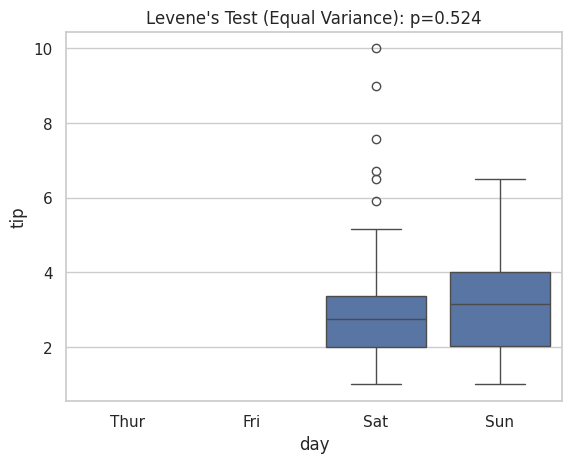

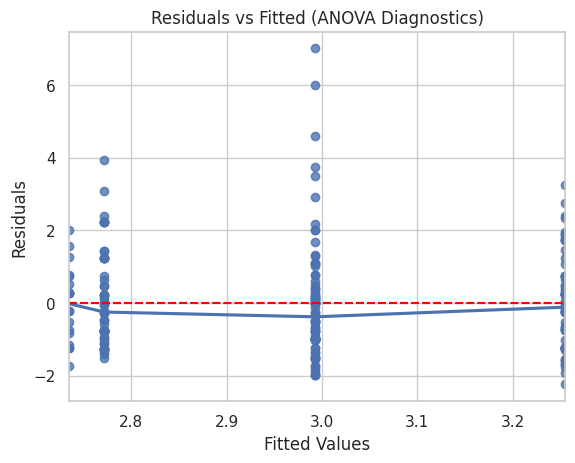

In [26]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statsmodels.stats.weightstats import ztest, ttest_ind
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.stats import chi2_contingency

# Load dataset
tips = sns.load_dataset("tips")

# 1. One-sample T-test (Is average tip > 2.5?)
sample_data = tips["tip"]
t_stat, p_val = stats.ttest_1samp(sample_data, popmean=2.5)
sns.histplot(sample_data, kde=True)
plt.axvline(2.5, color="red", linestyle="--", label="Hypothesized Mean (2.5)")
plt.title(f"One-sample T-test: t={t_stat:.2f}, p={p_val:.3f}")
plt.legend()
plt.show()

# 2. Independent Two-sample T-test (tips by gender)
male = tips[tips["sex"] == "Male"]["tip"]
female = tips[tips["sex"] == "Female"]["tip"]
t_stat, p_val = stats.ttest_ind(male, female)
sns.kdeplot(male, label="Male")
sns.kdeplot(female, label="Female")
plt.title(f"Two-sample T-test: t={t_stat:.2f}, p={p_val:.3f}")
plt.legend()
plt.show()

# 3. Paired T-test (simulated before/after weight loss)
np.random.seed(0)
before = np.random.normal(80, 5, 30)
after = before - np.random.normal(3, 1, 30)
t_stat, p_val = stats.ttest_rel(before, after)
plt.plot(before, label="Before")
plt.plot(after, label="After")
plt.title(f"Paired T-test: t={t_stat:.2f}, p={p_val:.3f}")
plt.legend()
plt.show()

# 4. Z-test (Mean tip by gender)
z_stat, p_val = ztest(male, female)
sns.boxplot(data=tips, x="sex", y="tip")
plt.title(f"Z-test for Mean Tip: z={z_stat:.2f}, p={p_val:.3f}")
plt.show()

# 5. One-way ANOVA (tip ~ day)
model = ols('tip ~ C(day)', data=tips).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
sns.boxplot(data=tips, x="day", y="tip")
plt.title(f"One-way ANOVA: p={anova_table['PR(>F)'][0]:.4f}")
plt.show()

# 6. Post-Hoc: Tukey HSD if ANOVA is significant
from statsmodels.stats.multicomp import pairwise_tukeyhsd
tukey = pairwise_tukeyhsd(endog=tips['tip'], groups=tips['day'], alpha=0.05)
print(tukey)

# 7. Chi-square Test of Independence (sex vs smoker)
contingency = pd.crosstab(tips["sex"], tips["smoker"])
chi2, p, dof, expected = chi2_contingency(contingency)
sns.heatmap(contingency, annot=True, fmt="d", cmap="Blues")
plt.title(f"Chi-square Test: χ²={chi2:.2f}, p={p:.3f}")
plt.show()

# 8. Normality Check – QQ Plot
sm.qqplot(tips["tip"], line="s")
plt.title("QQ Plot: Normality Check for Tip")
plt.show()

# 9. Homogeneity of Variance – Levene's Test
stat, p = stats.levene(
    tips[tips["day"] == "Sun"]["tip"],
    tips[tips["day"] == "Sat"]["tip"]
)
sns.boxplot(data=tips[tips["day"].isin(["Sun", "Sat"])], x="day", y="tip")
plt.title(f"Levene's Test (Equal Variance): p={p:.3f}")
plt.show()

# 10. Residual Plot (ANOVA diagnostics)
residuals = model.resid
fitted = model.fittedvalues
sns.residplot(x=fitted, y=residuals, lowess=True)
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Fitted (ANOVA Diagnostics)")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.show()


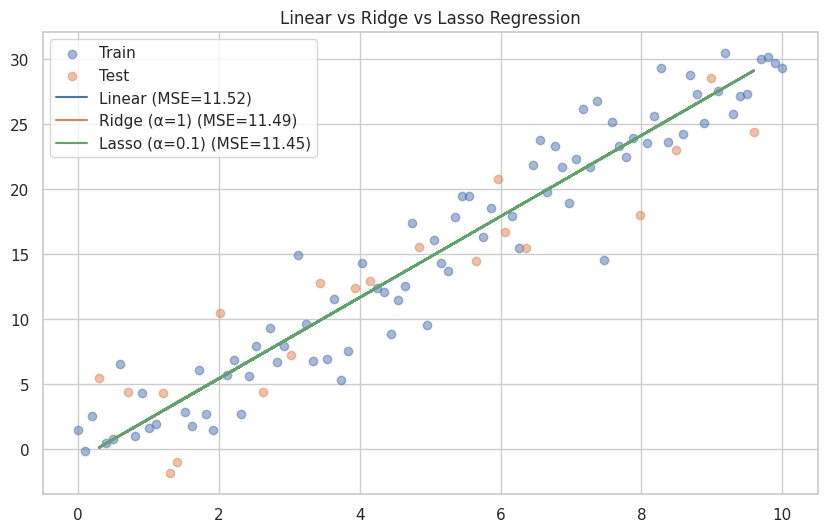

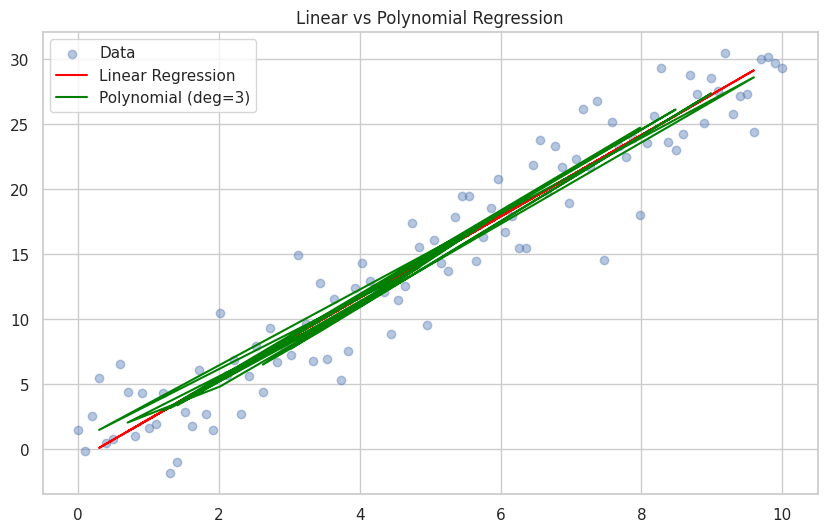

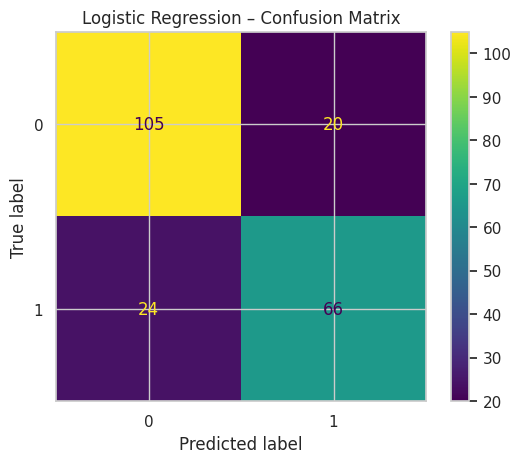

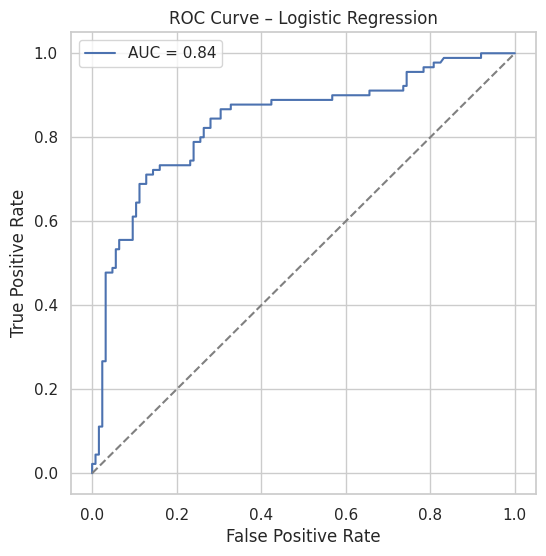

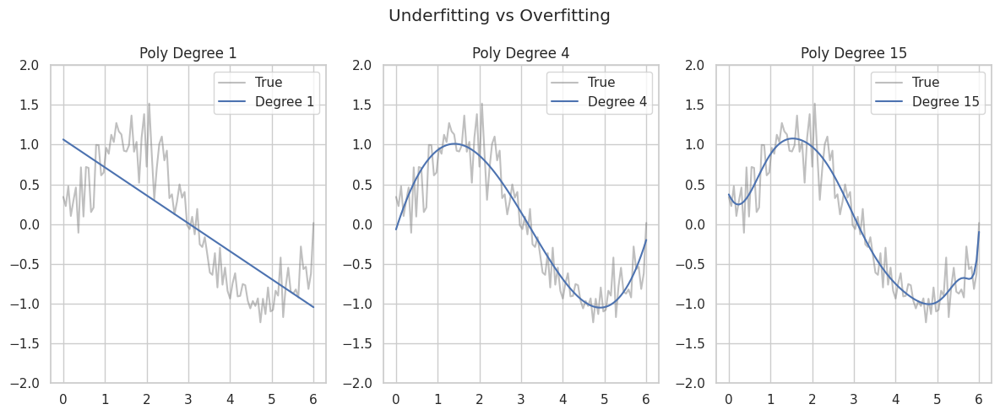

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, confusion_matrix, classification_report, roc_curve, auc
from sklearn.model_selection import train_test_split

# Simulate data
np.random.seed(42)
X = np.linspace(0, 10, 100)
y = 3 * X + np.random.normal(0, 3, size=X.shape)

X = X.reshape(-1, 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# 1. Compare Linear, Ridge, and Lasso Regression
models = {
    "Linear": LinearRegression(),
    "Ridge (α=1)": Ridge(alpha=1),
    "Lasso (α=0.1)": Lasso(alpha=0.1)
}

plt.figure(figsize=(10,6))
plt.scatter(X_train, y_train, label="Train", alpha=0.5)
plt.scatter(X_test, y_test, label="Test", alpha=0.5)

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    plt.plot(X_test, y_pred, label=f"{name} (MSE={mean_squared_error(y_test, y_pred):.2f})")

plt.title("Linear vs Ridge vs Lasso Regression")
plt.legend()
plt.show()

# 2. Compare Linear vs Polynomial Regression
poly_model = make_pipeline(PolynomialFeatures(degree=3), LinearRegression())
poly_model.fit(X_train, y_train)
y_pred_poly = poly_model.predict(X_test)

lin_model = LinearRegression().fit(X_train, y_train)
y_pred_lin = lin_model.predict(X_test)

plt.figure(figsize=(10,6))
plt.scatter(X, y, alpha=0.4, label="Data")
plt.plot(X_test, y_pred_lin, label="Linear Regression", color="red")
plt.plot(X_test, y_pred_poly, label="Polynomial (deg=3)", color="green")
plt.title("Linear vs Polynomial Regression")
plt.legend()
plt.show()

# 3. Classification: Logistic Regression on Titanic
from sklearn.metrics import ConfusionMatrixDisplay

titanic = sns.load_dataset("titanic").dropna(subset=["sex", "age", "fare", "survived"])
titanic["sex_binary"] = (titanic["sex"] == "male").astype(int)

X = titanic[["age", "fare", "sex_binary"]]
y = titanic["survived"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

clf = LogisticRegression(max_iter=1000)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
plt.title("Logistic Regression – Confusion Matrix")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0,1], [0,1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve – Logistic Regression")
plt.legend()
plt.show()

# 4. Overfitting vs Underfitting (Simulation)
X = np.linspace(0, 6, 100)
y_true = np.sin(X) + np.random.normal(0, 0.2, size=X.shape)

plt.figure(figsize=(12, 5))

for i, deg in enumerate([1, 4, 15]):
    plt.subplot(1, 3, i+1)
    model = make_pipeline(PolynomialFeatures(degree=deg), LinearRegression())
    model.fit(X.reshape(-1,1), y_true)
    y_pred = model.predict(X.reshape(-1,1))
    plt.plot(X, y_true, label="True", color="gray", alpha=0.5)
    plt.plot(X, y_pred, label=f"Degree {deg}")
    plt.title(f"Poly Degree {deg}")
    plt.ylim(-2, 2)
    plt.legend()

plt.suptitle("Underfitting vs Overfitting")
plt.tight_layout()
plt.show()


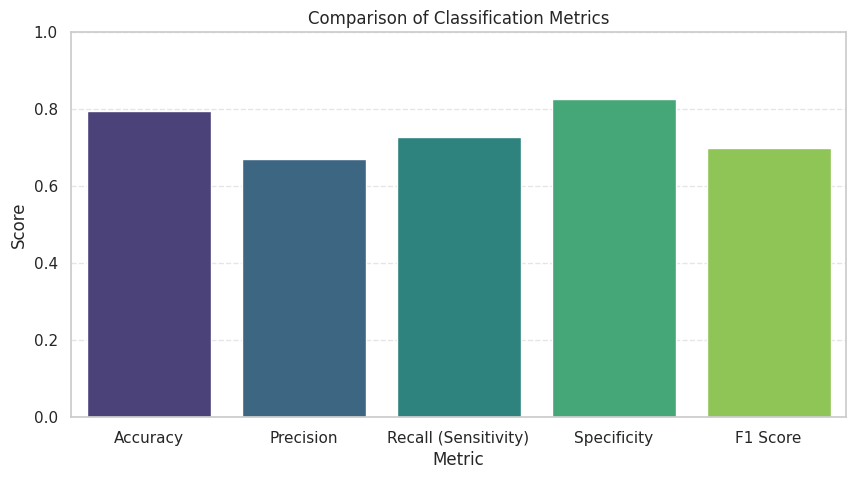

              Metric    Value
            Accuracy 0.795349
           Precision 0.671053
Recall (Sensitivity) 0.728571
         Specificity 0.827586
            F1 Score 0.698630


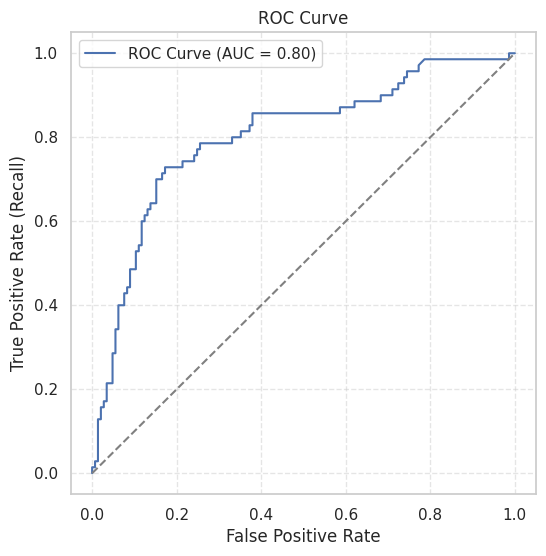

In [28]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Titanic binary classifier (Male vs Female survival)
titanic = sns.load_dataset("titanic").dropna(subset=["sex", "age", "fare", "survived"])
titanic["sex_binary"] = (titanic["sex"] == "male").astype(int)

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X = titanic[["age", "fare", "sex_binary"]]
y = titanic["survived"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

# Calculate metrics manually
accuracy = (tp + tn) / (tp + tn + fp + fn)
precision = tp / (tp + fp)
recall = tp / (tp + fn)
specificity = tn / (tn + fp)
f1 = 2 * (precision * recall) / (precision + recall)

# Create DataFrame for comparison
metrics_df = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall (Sensitivity)", "Specificity", "F1 Score"],
    "Value": [accuracy, precision, recall, specificity, f1]
})

# Barplot
plt.figure(figsize=(10, 5))
sns.barplot(data=metrics_df, x="Metric", y="Value", palette="viridis")
plt.ylim(0, 1)
plt.title("Comparison of Classification Metrics")
plt.ylabel("Score")
plt.grid(True, axis='y', linestyle="--", alpha=0.5)
plt.show()

# Print numerical values
print(metrics_df.to_string(index=False))

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate (Recall)")
plt.title("ROC Curve")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


In [29]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns

# Set seed for reproducibility
np.random.seed(42)

# Create a skewed population (exponential distribution)
population = np.random.exponential(scale=2, size=100000)

# Parameters
sample_size = 50
num_iterations = 100
sample_means = []

# Set up the plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.set_style("whitegrid")
bars = None

def update(frame):
    global sample_means, bars
    sample = np.random.choice(population, size=sample_size, replace=False)
    sample_means.append(np.mean(sample))
    ax.clear()

    # Histogram of sample means
    sns.histplot(sample_means, kde=True, stat="density", bins=20, color='skyblue', ax=ax)
    ax.set_xlim(0, 6)
    ax.set_ylim(0, 2)
    ax.set_title(f"Central Limit Theorem Simulation\nIteration {frame+1} — Sample size: {sample_size}")
    ax.set_xlabel("Sample Means")
    ax.set_ylabel("Density")

ani = animation.FuncAnimation(fig, update, frames=num_iterations, repeat=False, interval=200)
plt.close()  # Prevent static plot in Colab

# To display in Colab:
from IPython.display import HTML
HTML(ani.to_jshtml())


In [30]:
!pip install -q ipywidgets scikit-learn seaborn

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, precision_score, recall_score, roc_curve, auc
from sklearn.model_selection import train_test_split
from IPython.display import display
import ipywidgets as widgets

# Load & prep Titanic data
titanic = sns.load_dataset("titanic").dropna(subset=["age", "fare", "sex", "survived"])
titanic["sex_binary"] = (titanic["sex"] == "male").astype(int)

X = titanic[["age", "fare", "sex_binary"]]
y = titanic["survived"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Fit logistic regression
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
probs = model.predict_proba(X_test)[:, 1]

# ROC curve data
fpr, tpr, thresholds = roc_curve(y_test, probs)
roc_auc = auc(fpr, tpr)

# INTERACTIVE DISPLAY FUNCTION
def update_threshold(thresh):
    preds = (probs >= thresh).astype(int)
    cm = confusion_matrix(y_test, preds)
    precision = precision_score(y_test, preds)
    recall = recall_score(y_test, preds)

    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

    # ROC curve
    axs[0].plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
    axs[0].axvline((preds != y_test).mean(), color='red', linestyle='--', label=f"Threshold = {thresh:.2f}")
    axs[0].plot([0, 1], [0, 1], 'k--')
    axs[0].set_xlabel("False Positive Rate")
    axs[0].set_ylabel("True Positive Rate (Recall)")
    axs[0].set_title("ROC Curve")
    axs[0].legend()

    # Confusion Matrix as heatmap
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axs[1], cbar=False)
    axs[1].set_title(f"Confusion Matrix @ Threshold {thresh:.2f}")
    axs[1].set_xlabel("Predicted")
    axs[1].set_ylabel("Actual")

    plt.tight_layout()
    plt.show()

    print(f"Precision: {precision:.2f} | Recall: {recall:.2f}")

# Interactive slider
threshold_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Threshold:')
widgets.interact(update_threshold, thresh=threshold_slider)


interactive(children=(FloatSlider(value=0.5, description='Threshold:', max=1.0, step=0.01), Output()), _dom_cl…

<function __main__.update_threshold(thresh)>

In [31]:
!pip install -q pywaffle

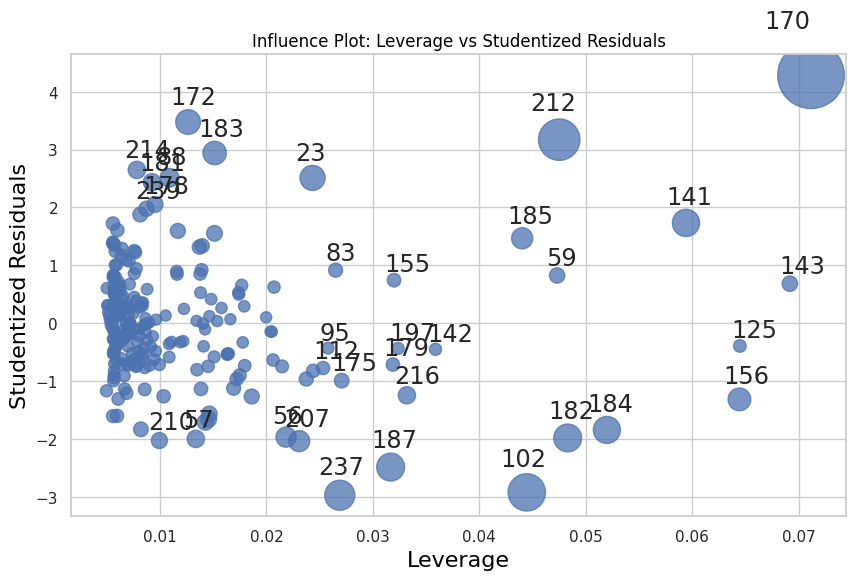

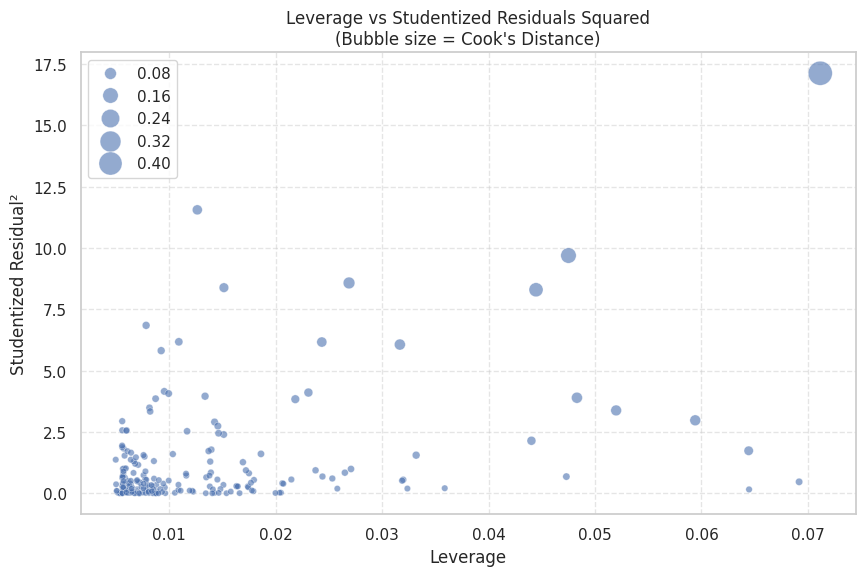

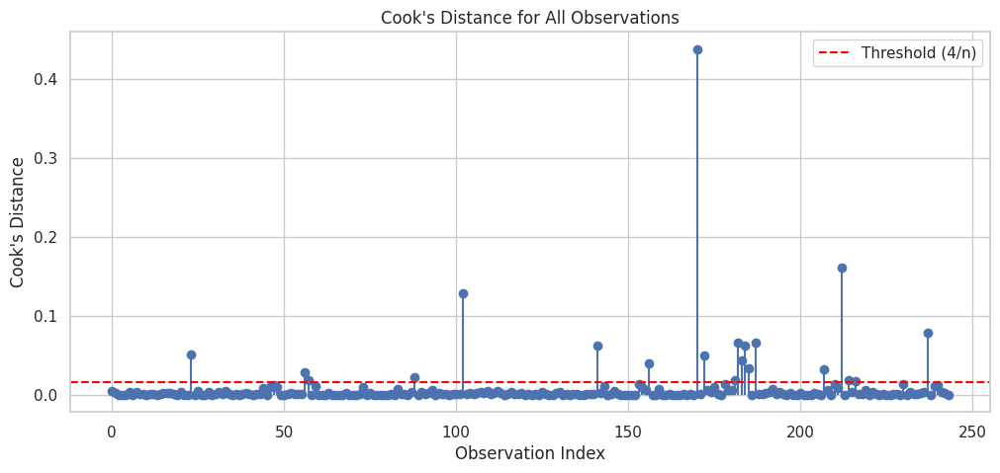

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd

# Load dataset
tips = sns.load_dataset("tips")

# Build a regression model
X = tips[["total_bill", "size"]]
X = sm.add_constant(X)
y = tips["tip"]

model = sm.OLS(y, X).fit()

# 1. Influence Plot (Leverage vs Studentized Residuals)
fig, ax = plt.subplots(figsize=(10, 6))
sm.graphics.influence_plot(model, ax=ax, criterion="cooks")
plt.title("Influence Plot: Leverage vs Studentized Residuals")
plt.show()

# 2. Leverage vs Squared Residuals
influence = model.get_influence()
leverage = influence.hat_matrix_diag
resid_student = influence.resid_studentized_internal
cook = influence.cooks_distance[0]

plt.figure(figsize=(10, 6))
sns.scatterplot(x=leverage, y=resid_student**2, size=cook, sizes=(20, 300), alpha=0.6)
plt.xlabel("Leverage")
plt.ylabel("Studentized Residual²")
plt.title("Leverage vs Studentized Residuals Squared\n(Bubble size = Cook's Distance)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# 3. Cook's Distance Bar Plot
plt.figure(figsize=(12, 5))
plt.stem(cook, basefmt=" ")
plt.axhline(4 / len(X), color="red", linestyle="--", label="Threshold (4/n)")
plt.title("Cook's Distance for All Observations")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.legend()
plt.show()


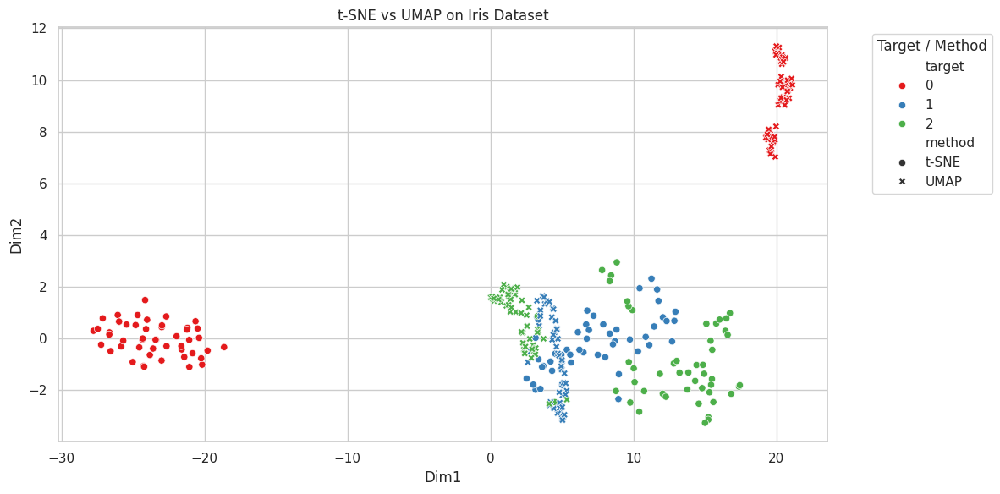

In [33]:
!pip install -q umap-learn

from sklearn.manifold import TSNE
import umap
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_iris
import pandas as pd

# Load Iris dataset
iris = load_iris()
X = iris.data
y = iris.target
target_names = iris.target_names

# Scale data before reduction
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate='auto', init='pca', random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = reducer.fit_transform(X_scaled)

# Convert to DataFrame for plotting
df_tsne = pd.DataFrame(X_tsne, columns=["Dim1", "Dim2"])
df_tsne["target"] = y
df_tsne["method"] = "t-SNE"

df_umap = pd.DataFrame(X_umap, columns=["Dim1", "Dim2"])
df_umap["target"] = y
df_umap["method"] = "UMAP"

# Combine
df_vis = pd.concat([df_tsne, df_umap])

# Plot both
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_vis, x="Dim1", y="Dim2", hue="target", style="method", palette="Set1")
plt.title("t-SNE vs UMAP on Iris Dataset")
plt.legend(title="Target / Method", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


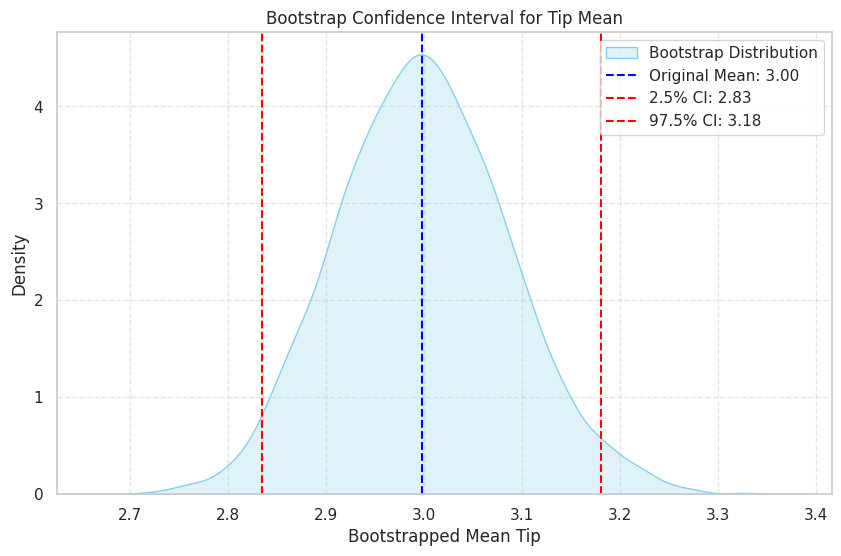

In [34]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset
tips = sns.load_dataset("tips")

# Bootstrap Parameters
np.random.seed(42)
n_iterations = 5000
statistic = np.mean  # You can switch to np.median, np.std, etc.
sample_size = len(tips["tip"])

# Collect bootstrap samples
bootstrap_estimates = []
for _ in range(n_iterations):
    sample = tips["tip"].sample(n=sample_size, replace=True)
    stat = statistic(sample)
    bootstrap_estimates.append(stat)

# Convert to array
bootstrap_estimates = np.array(bootstrap_estimates)

# Confidence Interval (e.g., 95%)
lower = np.percentile(bootstrap_estimates, 2.5)
upper = np.percentile(bootstrap_estimates, 97.5)
original_stat = statistic(tips["tip"])

# Plot KDE of bootstrapped estimates
plt.figure(figsize=(10, 6))
sns.kdeplot(bootstrap_estimates, fill=True, color='skyblue', label="Bootstrap Distribution")
plt.axvline(original_stat, color='blue', linestyle='--', label=f"Original Mean: {original_stat:.2f}")
plt.axvline(lower, color='red', linestyle='--', label=f"2.5% CI: {lower:.2f}")
plt.axvline(upper, color='red', linestyle='--', label=f"97.5% CI: {upper:.2f}")
plt.title("Bootstrap Confidence Interval for Tip Mean")
plt.xlabel("Bootstrapped Mean Tip")
plt.ylabel("Density")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


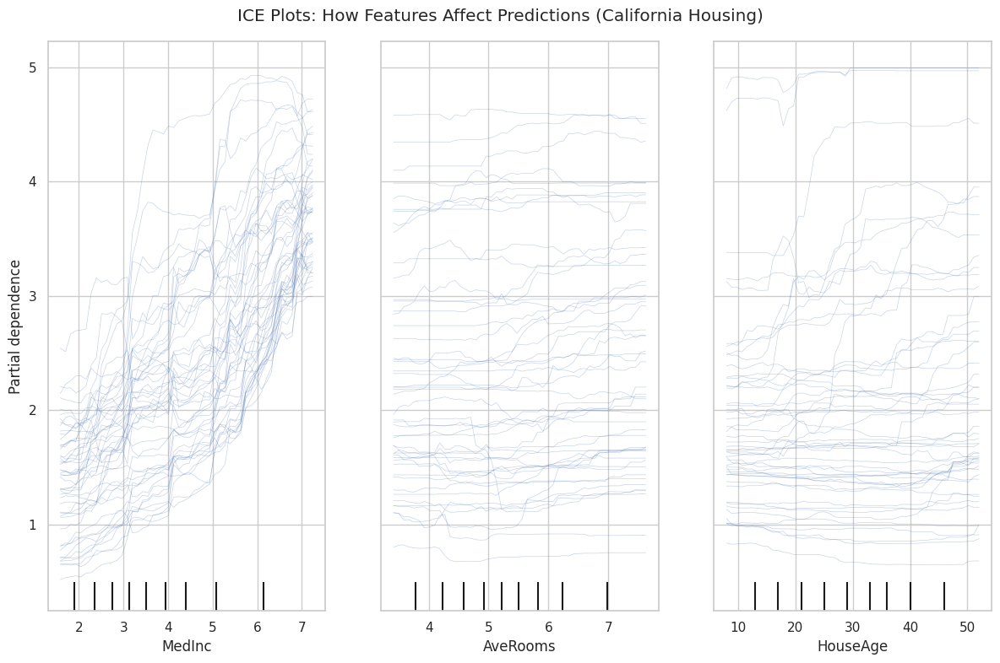

In [35]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.model_selection import train_test_split
from sklearn.datasets import fetch_california_housing
import matplotlib.pyplot as plt

# Load a real-world dataset (California Housing)
data = fetch_california_housing(as_frame=True)
X = data.data
y = data.target

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Fit model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Choose features for ICE (can be any continuous variable)
features = ["MedInc", "AveRooms", "HouseAge"]

# Plot ICE
fig, ax = plt.subplots(figsize=(12, 8))
PartialDependenceDisplay.from_estimator(
    model, X_test, features, kind="individual", subsample=50, grid_resolution=50, ax=ax
)
plt.suptitle("ICE Plots: How Features Affect Predictions (California Housing)")
plt.tight_layout()
plt.show()


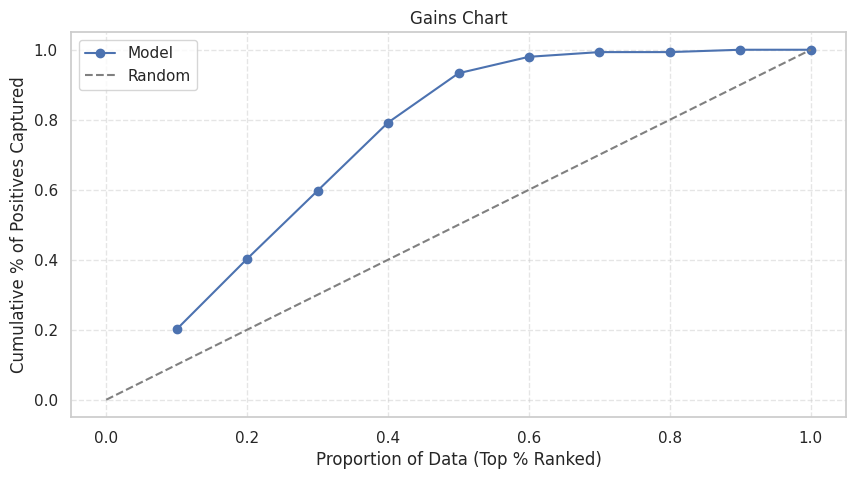

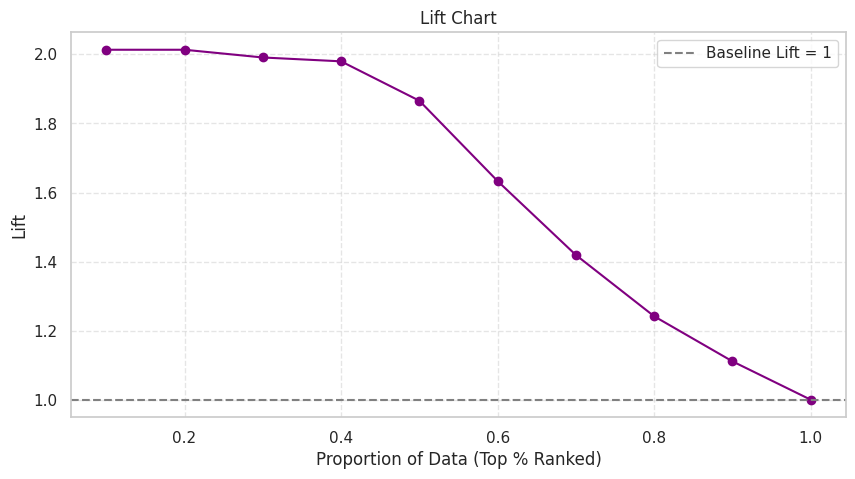

In [36]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.datasets import make_classification

# Generate or load dataset
# You can replace this with titanic or any binary classification dataset
X, y = make_classification(n_samples=1000, n_features=5, n_informative=3, random_state=42)
X = pd.DataFrame(X, columns=[f"f{i}" for i in range(5)])

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_proba = model.predict_proba(X_test)[:, 1]

# Create DataFrame for gains/lift
results = pd.DataFrame({"y_true": y_test, "y_proba": y_proba})
results = results.sort_values("y_proba", ascending=False).reset_index(drop=True)
results["decile"] = pd.qcut(results.index, 10, labels=False)

# Gains calculation
gains = results.groupby("decile").agg({"y_true": ["sum", "count"]})
gains.columns = ["positives", "count"]
gains["cum_positives"] = gains["positives"].cumsum()
gains["cum_pct_positives"] = gains["cum_positives"] / gains["positives"].sum()
gains["data_pct"] = (np.arange(1, 11)) / 10

# Lift calculation
gains["lift"] = gains["cum_pct_positives"] / gains["data_pct"]

# Plot Gains Chart
plt.figure(figsize=(10, 5))
plt.plot(gains["data_pct"], gains["cum_pct_positives"], marker="o", label="Model")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random")
plt.title("Gains Chart")
plt.xlabel("Proportion of Data (Top % Ranked)")
plt.ylabel("Cumulative % of Positives Captured")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# Plot Lift Chart
plt.figure(figsize=(10, 5))
plt.plot(gains["data_pct"], gains["lift"], marker="o", color="purple")
plt.axhline(1, linestyle="--", color="gray", label="Baseline Lift = 1")
plt.title("Lift Chart")
plt.xlabel("Proportion of Data (Top % Ranked)")
plt.ylabel("Lift")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


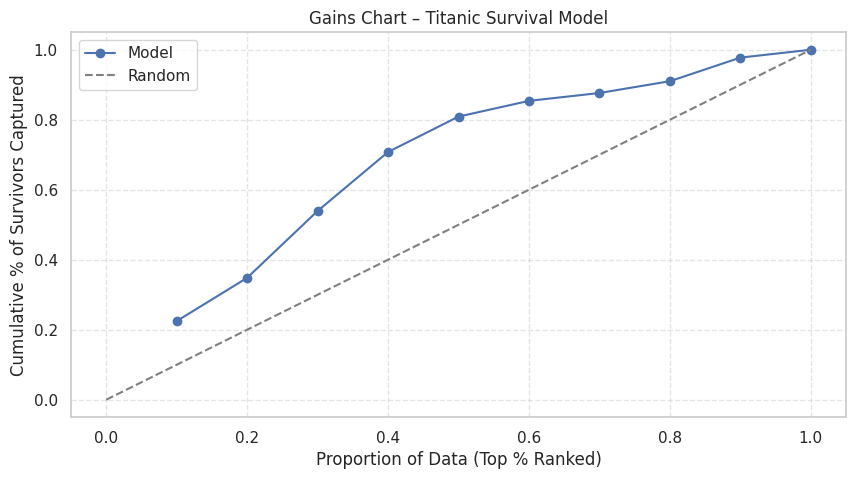

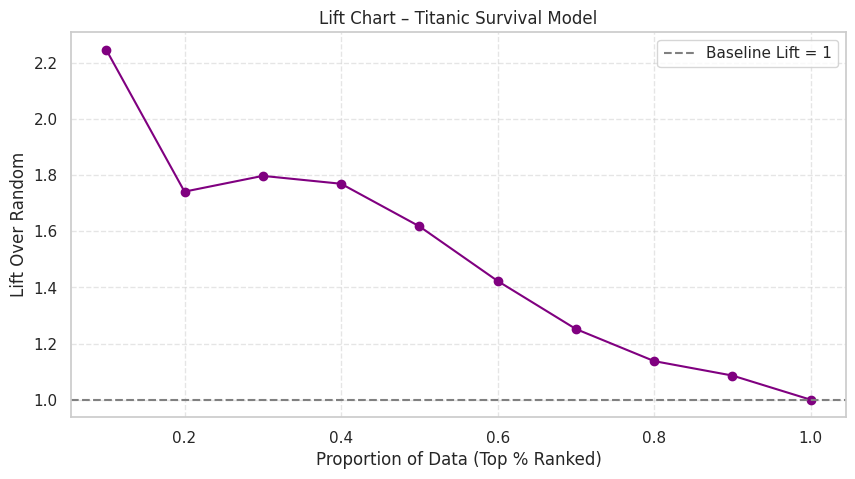

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Load Titanic dataset
titanic = sns.load_dataset("titanic").dropna(subset=["sex", "age", "fare", "survived"])
titanic["sex_binary"] = (titanic["sex"] == "male").astype(int)

# Feature and target
X = titanic[["age", "fare", "sex_binary"]]
y = titanic["survived"]

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Predict probabilities
y_proba = model.predict_proba(X_test)[:, 1]

# Create DataFrame for gains/lift calculation
results = pd.DataFrame({"y_true": y_test, "y_proba": y_proba})
results = results.sort_values("y_proba", ascending=False).reset_index(drop=True)
results["decile"] = pd.qcut(results.index, 10, labels=False)

# Compute gains
gains = results.groupby("decile").agg({"y_true": ["sum", "count"]})
gains.columns = ["positives", "count"]
gains["cum_positives"] = gains["positives"].cumsum()
gains["cum_pct_positives"] = gains["cum_positives"] / gains["positives"].sum()
gains["data_pct"] = (np.arange(1, 11)) / 10

# Compute lift
gains["lift"] = gains["cum_pct_positives"] / gains["data_pct"]

# Plot Gains Chart
plt.figure(figsize=(10, 5))
plt.plot(gains["data_pct"], gains["cum_pct_positives"], marker="o", label="Model")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random")
plt.title("Gains Chart – Titanic Survival Model")
plt.xlabel("Proportion of Data (Top % Ranked)")
plt.ylabel("Cumulative % of Survivors Captured")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# Plot Lift Chart
plt.figure(figsize=(10, 5))
plt.plot(gains["data_pct"], gains["lift"], marker="o", color="purple")
plt.axhline(1, linestyle="--", color="gray", label="Baseline Lift = 1")
plt.title("Lift Chart – Titanic Survival Model")
plt.xlabel("Proportion of Data (Top % Ranked)")
plt.ylabel("Lift Over Random")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


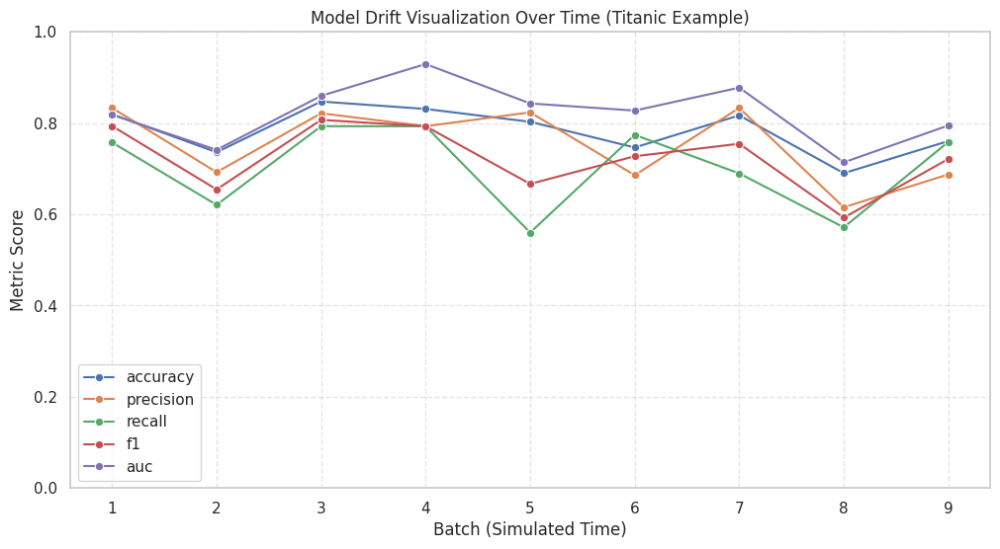

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split

# Simulate batch data for drift detection (based on Titanic dataset)
titanic = sns.load_dataset("titanic").dropna(subset=["sex", "age", "fare", "survived"])
titanic["sex_binary"] = (titanic["sex"] == "male").astype(int)

X = titanic[["age", "fare", "sex_binary"]]
y = titanic["survived"]

# Shuffle and simulate 10 time-based batches
n_batches = 10
titanic["batch"] = np.tile(np.arange(n_batches), len(titanic) // n_batches + 1)[:len(titanic)]

# Fit on initial batch (simulate training in production)
train_data = titanic[titanic["batch"] == 0]
X_train = train_data[["age", "fare", "sex_binary"]]
y_train = train_data["survived"]

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Evaluate on batches 1–9 to simulate monitoring
metrics = []

for batch in range(1, n_batches):
    test_data = titanic[titanic["batch"] == batch]
    X_test = test_data[["age", "fare", "sex_binary"]]
    y_test = test_data["survived"]

    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    metrics.append({
        "batch": batch,
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred, zero_division=0),
        "recall": recall_score(y_test, y_pred, zero_division=0),
        "f1": f1_score(y_test, y_pred, zero_division=0),
        "auc": roc_auc_score(y_test, y_proba)
    })

metrics_df = pd.DataFrame(metrics)

# Plot the metrics over batches
plt.figure(figsize=(12, 6))
for col in ["accuracy", "precision", "recall", "f1", "auc"]:
    sns.lineplot(x="batch", y=col, data=metrics_df, label=col, marker="o")

plt.title("Model Drift Visualization Over Time (Titanic Example)")
plt.xlabel("Batch (Simulated Time)")
plt.ylabel("Metric Score")
plt.ylim(0, 1)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.show()


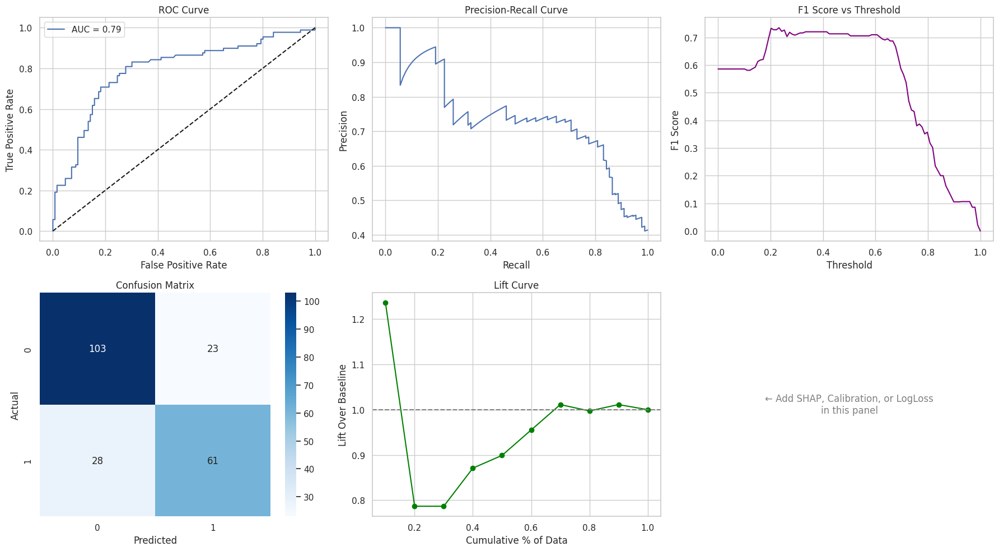

In [39]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import (
    roc_curve, precision_recall_curve, confusion_matrix, f1_score, roc_auc_score
)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Load Titanic data
titanic = sns.load_dataset("titanic").dropna(subset=["sex", "age", "fare", "survived"])
titanic["sex_binary"] = (titanic["sex"] == "male").astype(int)

X = titanic[["age", "fare", "sex_binary"]]
y = titanic["survived"]

# Split and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Predictions
y_proba = model.predict_proba(X_test)[:, 1]
y_pred = model.predict(X_test)

# Metrics
fpr, tpr, roc_thresholds = roc_curve(y_test, y_proba)
prec, rec, pr_thresholds = precision_recall_curve(y_test, y_proba)

thresholds = np.linspace(0, 1, 100)
f1_scores = [f1_score(y_test, y_proba >= t) for t in thresholds]

# Lift Curve
df_lift = pd.DataFrame({'y_true': y_test, 'y_proba': y_proba})
df_lift = df_lift.sort_values("y_proba", ascending=False)
df_lift["decile"] = pd.qcut(df_lift.index, 10, labels=False)

lift = df_lift.groupby("decile").agg({"y_true": ["sum", "count"]})
lift.columns = ["positives", "total"]
lift["cum_positives"] = lift["positives"].cumsum()
lift["cum_rate"] = lift["cum_positives"] / lift["positives"].sum()
lift["baseline"] = np.linspace(0.1, 1.0, 10)
lift["lift"] = lift["cum_rate"] / lift["baseline"]

# Grid Plot
fig, axs = plt.subplots(2, 3, figsize=(18, 10))
sns.set_style("whitegrid")

# ROC
axs[0, 0].plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test, y_proba):.2f}")
axs[0, 0].plot([0, 1], [0, 1], 'k--')
axs[0, 0].set_title("ROC Curve")
axs[0, 0].set_xlabel("False Positive Rate")
axs[0, 0].set_ylabel("True Positive Rate")
axs[0, 0].legend()

# Precision-Recall
axs[0, 1].plot(rec, prec)
axs[0, 1].set_title("Precision-Recall Curve")
axs[0, 1].set_xlabel("Recall")
axs[0, 1].set_ylabel("Precision")

# F1 vs Threshold
axs[0, 2].plot(thresholds, f1_scores, color='purple')
axs[0, 2].set_title("F1 Score vs Threshold")
axs[0, 2].set_xlabel("Threshold")
axs[0, 2].set_ylabel("F1 Score")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axs[1, 0])
axs[1, 0].set_title("Confusion Matrix")
axs[1, 0].set_xlabel("Predicted")
axs[1, 0].set_ylabel("Actual")

# Lift Chart
axs[1, 1].plot(lift["baseline"], lift["lift"], marker="o", color='green')
axs[1, 1].axhline(1, linestyle="--", color="gray")
axs[1, 1].set_title("Lift Curve")
axs[1, 1].set_xlabel("Cumulative % of Data")
axs[1, 1].set_ylabel("Lift Over Baseline")

# Empty / Optional Extra Space
axs[1, 2].axis('off')
axs[1, 2].text(0.5, 0.5, "← Add SHAP, Calibration, or LogLoss\nin this panel",
              ha="center", va="center", fontsize=12, color='gray')

plt.tight_layout()
plt.show()


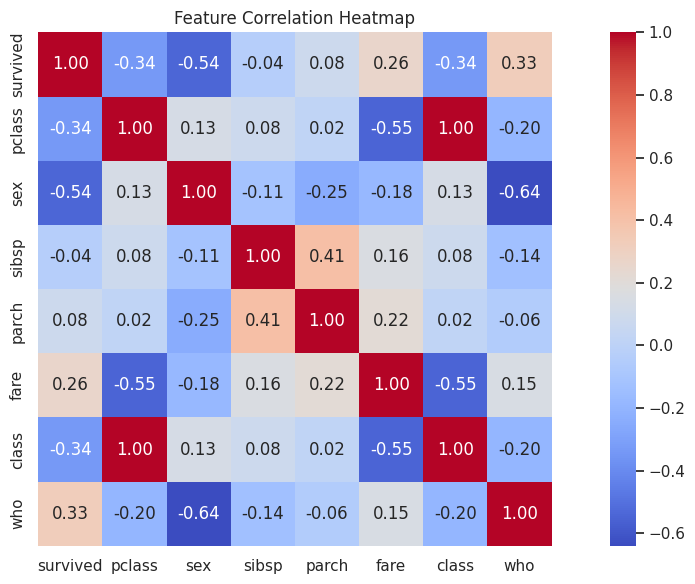

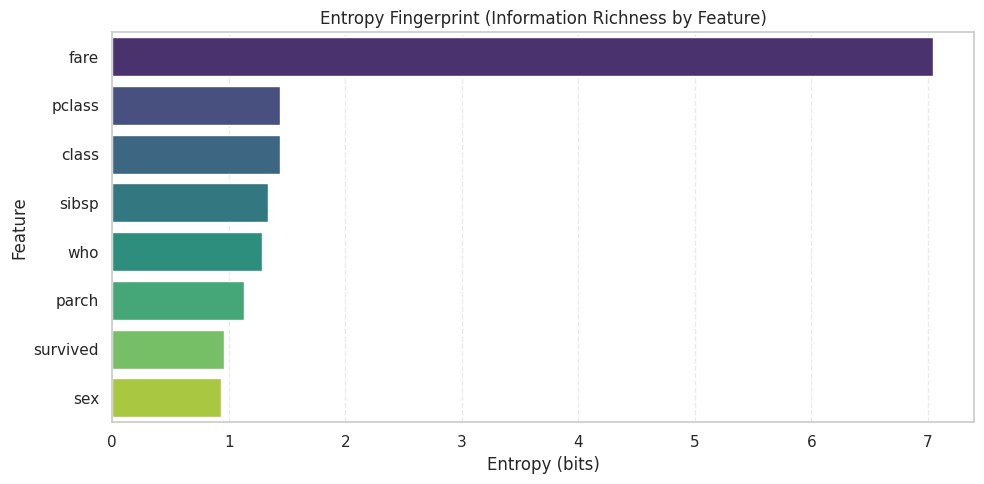

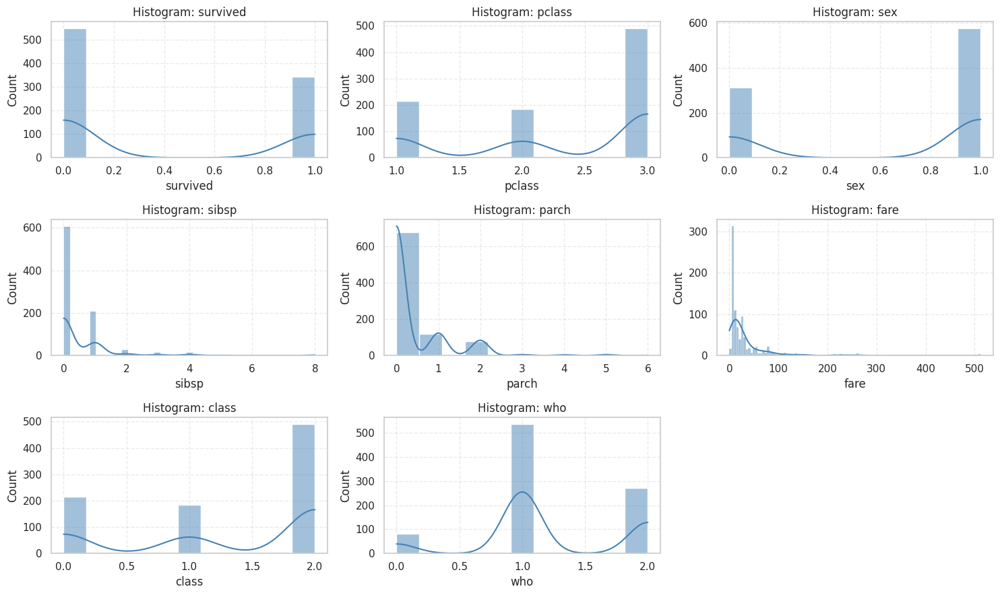

In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import entropy
from sklearn.preprocessing import LabelEncoder

# Load Titanic dataset
titanic = sns.load_dataset("titanic").copy()

# Drop ID-like columns and clean
df = titanic.drop(columns=["embark_town", "alive", "deck"])
df = df.dropna(axis=1, how="any")
df = df.select_dtypes(include=["number", "category", "object"])

# Encode categorical features temporarily
encoded_df = df.copy()
label_encoders = {}

for col in encoded_df.select_dtypes(include=["object", "category"]).columns:
    le = LabelEncoder()
    encoded_df[col] = le.fit_transform(encoded_df[col].astype(str))
    label_encoders[col] = le

# ---------- DISTRIBUTION HEATMAP ----------
plt.figure(figsize=(12, 6))
sns.heatmap(encoded_df.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()

# ---------- ENTROPY FINGERPRINT ----------
def compute_entropy(col):
    counts = col.value_counts()
    return entropy(counts, base=2)

entropies = encoded_df.apply(compute_entropy)
entropies = entropies.sort_values(ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x=entropies.values, y=entropies.index, palette="viridis")
plt.title("Entropy Fingerprint (Information Richness by Feature)")
plt.xlabel("Entropy (bits)")
plt.ylabel("Feature")
plt.grid(True, axis="x", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

# ---------- HISTOGRAM FINGERPRINT ----------
numeric_cols = encoded_df.select_dtypes(include=["number"]).columns.tolist()

n_cols = 3
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 3))
axs = axs.flatten()

for i, col in enumerate(numeric_cols):
    sns.histplot(encoded_df[col], kde=True, ax=axs[i], color='steelblue')
    axs[i].set_title(f"Histogram: {col}")
    axs[i].grid(True, linestyle="--", alpha=0.4)

# Turn off unused axes
for j in range(i+1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()
